In [46]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [47]:
import sys
import os
from matplotlib import pyplot as plt
from pprint import pprint
from intake import open_esm_datastore
import pandas as pd
import cftime
tool_dir = '/g/data/tm70/ml0072/COMMON/git_repos/fork_access-eval-recipes/ml_create_own_datastore'
sys.path.append(tool_dir)
from common_functions import _expt_name_combo, _read_ryaml, plot_time_series_combo, plot_time_series_combo2, plot_time_series_combo3, _set_default_plt_params, plot2d, plot3d,plot3d2,plot3d3


In [48]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [49]:
yaml_input = 'E_0.25d_restart014_trunc.yaml'
yamlfile_path = os.path.join(tool_dir,yaml_input)
yaml_input = _read_ryaml(yamlfile_path)
MOM_contrl_dir = yaml_input['base_dir_name']
contrl_name = 'DT_THERM_1350_DIABATIC_FIRST_True_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_0'

MOM_expt_dir1 = yaml_input['namelists']['MOM_input']['MOM_input_dirs_restart014']
MOM_list1_combo = yaml_input['namelists']['MOM_input']['MOM_list1_combo']
expt_names = _expt_name_combo(MOM_list1_combo)
#MOM_dirs = list(MOM_expt_dir1)
#MOM_names = list(expt_names)

In [50]:
yaml_input = '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/Expts_manager_025deg_restart022_control.yaml'
yamlfile_path = os.path.join(tool_dir,yaml_input)
yaml_input = _read_ryaml(yamlfile_path)

MOM_expt_dir2 = yaml_input['namelists']['MOM_input']['MOM_input_dirs_restart014']
MOM_list2_combo = yaml_input['namelists']['MOM_input']['MOM_list1_combo']
expt_names2 = _expt_name_combo(MOM_list2_combo)

In [51]:
yaml_input = '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/Expts_manager_025deg_restart_rest.yaml'
yamlfile_path = os.path.join(tool_dir,yaml_input)
yaml_input = _read_ryaml(yamlfile_path)

MOM_expt_dir3 = yaml_input['namelists']['MOM_input']['MOM_input_dirs_restart014']
MOM_list3_combo = yaml_input['namelists']['MOM_input']['MOM_list1_combo']
expt_names3 = _expt_name_combo(MOM_list3_combo)

In [52]:
MOM_dirs = [MOM_contrl_dir]+list(MOM_expt_dir1) +list(MOM_expt_dir2)+list(MOM_expt_dir3)
MOM_names = [contrl_name] + list(expt_names) + list(expt_names2)+ list(expt_names3)

pprint(MOM_dirs)
pprint(MOM_names)

['Ctrl-025deg_jra55do_ryf',
 'lexpt1_r14',
 'lexpt2_r14',
 'lexpt3_r14',
 'lexpt4_r14',
 'lexpt0_r14',
 'lexpt0_r22',
 'lexpt4_rr',
 'lexpt0_rr']
['DT_THERM_1350_DIABATIC_FIRST_True_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_0',
 'DT_THERM_2700_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_2700_MAXTRUNC_0',
 'DT_THERM_5400_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_5400_MAXTRUNC_20',
 'DT_THERM_6750_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_6750_MAXTRUNC_20',
 'DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_10800_MAXTRUNC_100',
 'DT_THERM_1350_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_1350_MAXTRUNC_0',
 'DT_THERM_1350_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_1350_MAXTRUNC_0',
 'DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_10800_MAXTRUNC_100',
 'DT_THERM_1350_DIABATIC_FIRST_False_THERMO_SPANS_COUPLI

In [53]:
output_expt_path = '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg'
intake_esm_ds = 'intake_esm_ds.json'

In [54]:
datastore_tot = []
MOM_dirs_tot = []
MOM_names_tot = []
for i,j in zip(MOM_dirs,MOM_names):
    archive_path = os.path.join(f"{output_expt_path}",f"{i}","archive")
    datastore_path = os.path.join(f"{archive_path}",intake_esm_ds)
    if os.path.isfile(datastore_path):
        datastore = open_esm_datastore(datastore_path,columns_with_iterables=["variable"])
        datastore_tot.append(datastore)
        MOM_dirs_tot.append(f"{i}")
        MOM_names_tot.append(f"{j}")
pprint(MOM_dirs_tot)
pprint(MOM_names_tot)
pprint(datastore_tot)

# reorder based on MOM_names_tot
# extracted_MOM_names_tot = ['_'.join(i.split('_')[:3]) for i in MOM_names_tot]
# extracted_MOM_names_tot[0] = 'Contrl_DT_THERM_1800'
# extracted_MOM_names_tot

['Ctrl-025deg_jra55do_ryf',
 'lexpt1_r14',
 'lexpt2_r14',
 'lexpt3_r14',
 'lexpt4_r14',
 'lexpt0_r14',
 'lexpt0_r22',
 'lexpt4_rr',
 'lexpt0_rr']
['DT_THERM_1350_DIABATIC_FIRST_True_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_0',
 'DT_THERM_2700_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_2700_MAXTRUNC_0',
 'DT_THERM_5400_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_5400_MAXTRUNC_20',
 'DT_THERM_6750_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_6750_MAXTRUNC_20',
 'DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_10800_MAXTRUNC_100',
 'DT_THERM_1350_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_1350_MAXTRUNC_0',
 'DT_THERM_1350_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_1350_MAXTRUNC_0',
 'DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_10800_MAXTRUNC_100',
 'DT_THERM_1350_DIABATIC_FIRST_False_THERMO_SPANS_COUPLI

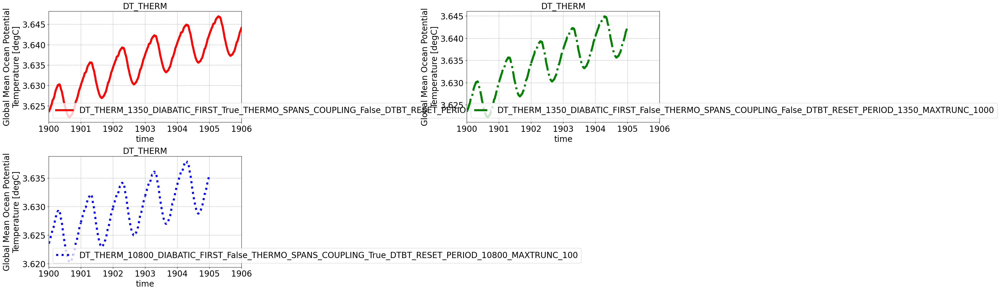

In [78]:
var = 'thetaoga'
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v' ,'d']
plots_config = [
            {'indices': [0, -1, -2], 'title': 'DT_THERM', 'base_index': None, 'legend_loc': 'lower left'},
           ]
plot_time_series_combo3(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        plots_config=plots_config,
                        figsize=(30,10),
                        time_range = ['1900-01-01', '1906-01-01'],
                        xlims = ('1900-01-01', '1906-01-01'),
                        num_intervals = None,
                        use_subplots=True,
                        )

In [12]:
var = 'thetaoga'
#line_style = ['-','--','-.',':']
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v' ,'d']
subplots = [
            {'indices': [0, -1, -2], 'subplot': (2, 2, 4), 'title': 'DT_THERM', 'difference': 0, 'legend_loc': 'lower left'},
           ]
plot_time_series_combo2(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        subplots=subplots,
                        figsize=(30,10),
                        time_range = ['1900-01-01', '1904-01-01'],
                        xlims = ('1900-01-01', '1904-01-01'),
                        num_intervals = None,
                        )

NameError: name 'axes' is not defined

<Figure size 3000x1000 with 0 Axes>

In [ ]:
var = 'thetaoga'
#line_style = ['-','--','-.',':']
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v' ,'d']
subplots = [
            {'indices': [0, -1, -2], 'subplot': (2, 2, 4), 'title': 'DT_THERM'   , 'difference': None, 'legend_loc': 'lower left'},
           ]
plot_time_series_combo2(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        subplots=subplots,
                        figsize=(30,10),
                        time_range = ['1900-01-01', '1904-01-01'],
                        xlims = ('1900-01-01', '1901-01-31'),
                        num_intervals = 3,
                        )

[0, -1, -2]


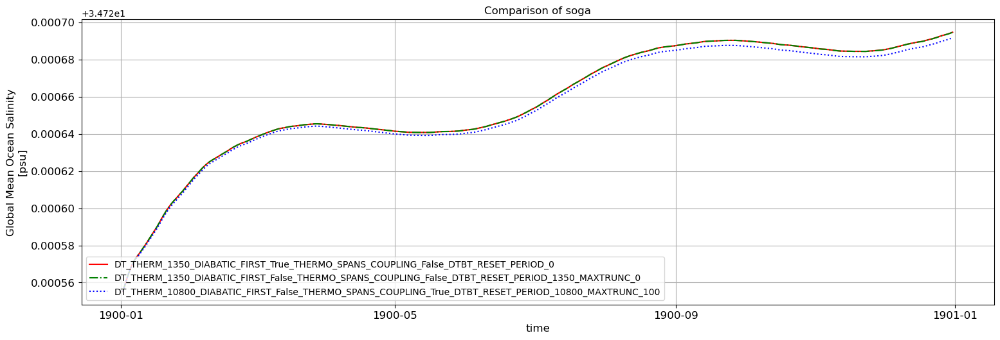

In [66]:
var = 'soga'
#line_style = ['-','--','-.',':']
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v' ,'d']
subplots = [
            {'indices': [0, -1, -2], 'subplot': (2, 2, 4), 'title': 'DT_THERM'   , 'difference': None, 'legend_loc': 'lower left'},
           ]
plot_time_series_combo2(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        subplots=subplots,
                        figsize=(30,10),
                        time_range = ['1900-01-01', '1900-12-31'],
                        )

0
1
2


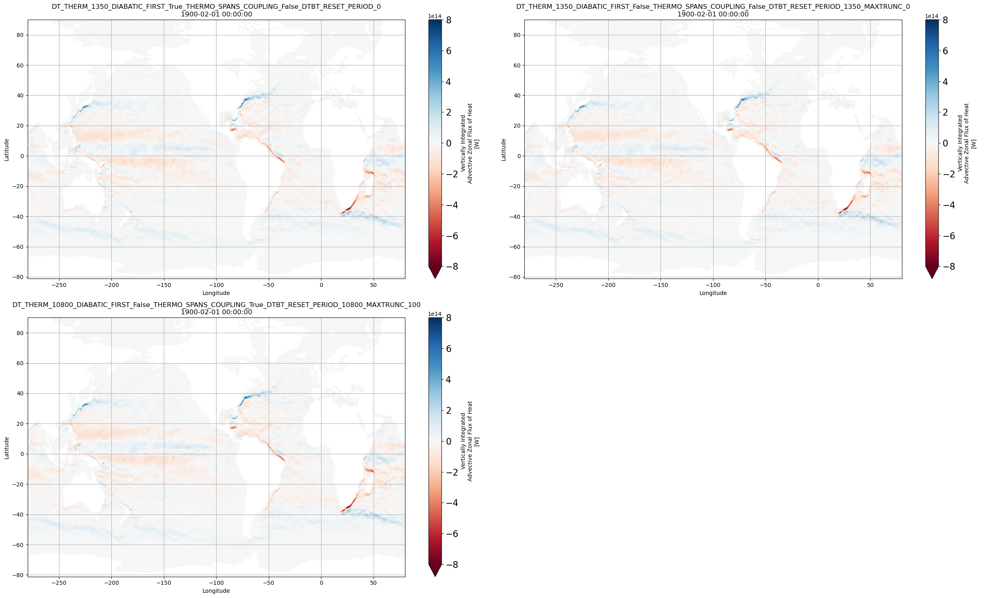

In [70]:
var = 'T_adx_2d'
common_time = pd.Timestamp('1900-02-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        depth_level = None,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15),cbar_range=[-8e14,8e14])

In [ ]:
var = 'T_adx_2d'
common_time = pd.Timestamp('1900-02-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15))


In [5]:
# Function to extract the numerical value after 'DT_THERM'
def extract_dt_therm_value(config):
    parts = config.split('_')
    for i, part in enumerate(parts):
        if part == 'DT' and i + 1 < len(parts) and 'THERM' in parts[i + 1]:
            try:
                # Extract the number after 'THERM' and convert to integer
                value = int(parts[i + 2])
                return value
            except ValueError:
                # Handle cases where the replacement results in an invalid integer
                print(f"Invalid integer conversion for config: {config}")
                return float('inf')  # Use a high value to sort problematic entries last
    return float('inf')  # Return a high value if pattern not found

# Combine the configs, names, and datasets into a list of tuples
combined = list(zip(MOM_names_tot, MOM_dirs_tot, datastore_tot))

# Sort the combined list based on the numerical values extracted from configs
sorted_combined = sorted(combined, key=lambda x: extract_dt_therm_value(x[0]))

# Separate the sorted names and datasets from the sorted combined list
sorted_dirs = [name for name, _ , _ in sorted_combined]
sorted_names = [name for _, name, _ in sorted_combined]
sorted_datasets = [dataset for _, _, dataset in sorted_combined]

rev_sorted_dirs = sorted_dirs[::-1]
rev_sorted_names = sorted_names[::-1]
rev_sorted_datasets = sorted_datasets[::-1]
# Print the sorted associated names and intake datasets
print("Sorted Names:")
for name in sorted_names:
    print(name)

for name in sorted_dirs:
    print(name)

print("\nSorted Intake Datasets:")
for dataset in sorted_datasets:
    print(dataset)

extracted_MOM_names_tot = ['_'.join(i.split('_')[:3]) for i in rev_sorted_dirs]
extracted_MOM_names_tot[-1] = 'Contrl_DT_THERM_1800'
extracted_MOM_names_tot

Sorted Names:
Ctrl-025deg_jra55do_ryf
lexpt1_r14
lexpt2_r14
lexpt3_r14
lexpt4_r14
DT_THERM_1350_DIABATIC_FIRST_True_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_0
DT_THERM_2700_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_2700_MAXTRUNC_0
DT_THERM_5400_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_5400_MAXTRUNC_20
DT_THERM_6750_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_6750_MAXTRUNC_20
DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_10800_MAXTRUNC_100

Sorted Intake Datasets:
<intake_esm_ds catalog with 1984 dataset(s) from 2665 asset(s)>
<intake_esm_ds catalog with 2164 dataset(s) from 2922 asset(s)>
<intake_esm_ds catalog with 2164 dataset(s) from 2922 asset(s)>
<intake_esm_ds catalog with 2164 dataset(s) from 2922 asset(s)>
<intake_esm_ds catalog with 2164 dataset(s) from 2922 asset(s)>


['DT_THERM_10800',
 'DT_THERM_6750',
 'DT_THERM_5400',
 'DT_THERM_2700',
 'Contrl_DT_THERM_1800']

[0, 1, 2, 3, 4]


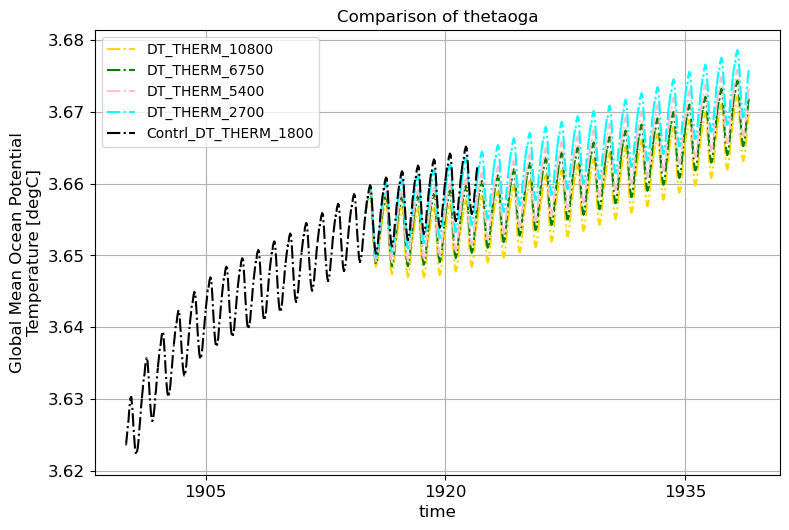

In [6]:
var = 'thetaoga'
#line_style = ['-','--','-.',':']
line_color = ['gold','green' ,'pink','cyan','black','purple','blue','red']
line_style = ['-.']
line_marker = ['o','s','v' ,'d']
subplots = [
            {'indices': None, 'subplot': (2, 2, 4), 'title': 'DT_THERM'   , 'difference': None, 'legend_loc': 'upper left'},
           ]
folder_path = '/g/data/tm70/ml0072/COMMON/git_repos/fork_access-eval-recipes/ml_create_own_datastore/0.25deg_runs'
file_path = os.path.join(folder_path, 'thetaoga.png')
plot_time_series_combo2(rev_sorted_datasets,extracted_MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        subplots=subplots,
                        file_path=file_path)

[3, 4]


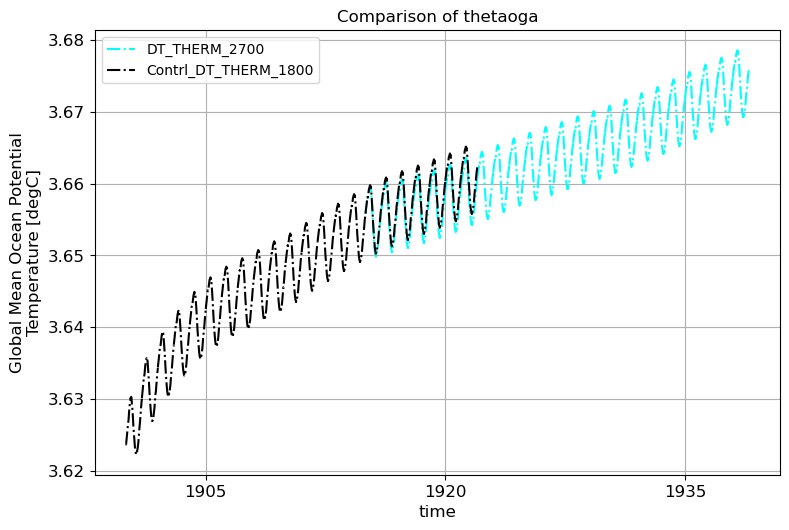

In [7]:
var = 'thetaoga'
#line_style = ['-','--','-.',':']
line_style = ['-.']
line_color = ['gold','green' ,'pink','cyan','black','purple','blue','red']
line_marker = ['o','s','v' ,'d']
subplots = [
            {'indices': [3,4], 'subplot': (2, 2, 4), 'title': 'DT_THERM'   , 'difference': None, 'legend_loc': 'upper left'},
           ]
folder_path = '/g/data/tm70/ml0072/COMMON/git_repos/fork_access-eval-recipes/ml_create_own_datastore/0.25deg_runs'
file_path = os.path.join(folder_path, 'thetaoga3.png')
plot_time_series_combo2(rev_sorted_datasets,extracted_MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        subplots=subplots,
                        file_path=file_path)

[0, 4]


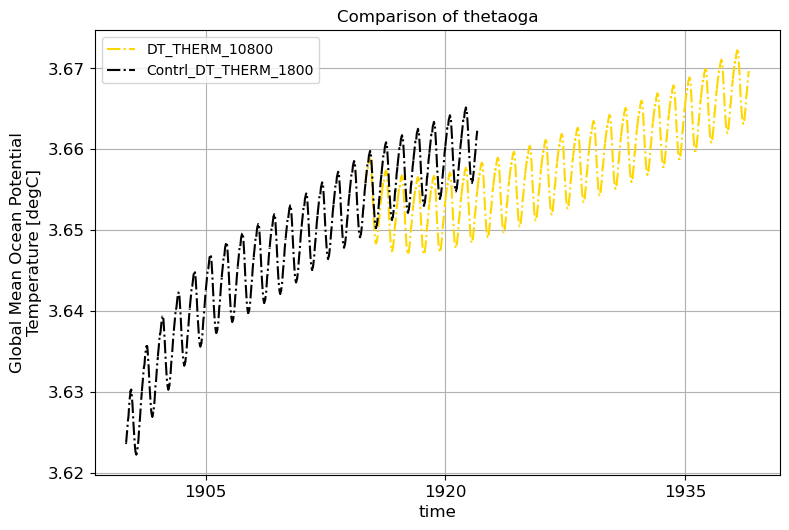

In [8]:
var = 'thetaoga'
#line_style = ['-','--','-.',':']
line_style = ['-.']
line_color = ['gold','green' ,'pink','cyan','black','purple','blue','red']
line_marker = ['o','s','v' ,'d']
subplots = [
            {'indices': [0,4], 'subplot': (2, 2, 4), 'title': 'DT_THERM'   , 'difference': None, 'legend_loc': 'upper left'},
           ]
folder_path = '/g/data/tm70/ml0072/COMMON/git_repos/fork_access-eval-recipes/ml_create_own_datastore/0.25deg_runs'
file_path = os.path.join(folder_path, 'thetaoga2.png')
plot_time_series_combo2(rev_sorted_datasets,extracted_MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        subplots=subplots,
                        file_path=file_path)

[0, 1, 2, 3, 4]


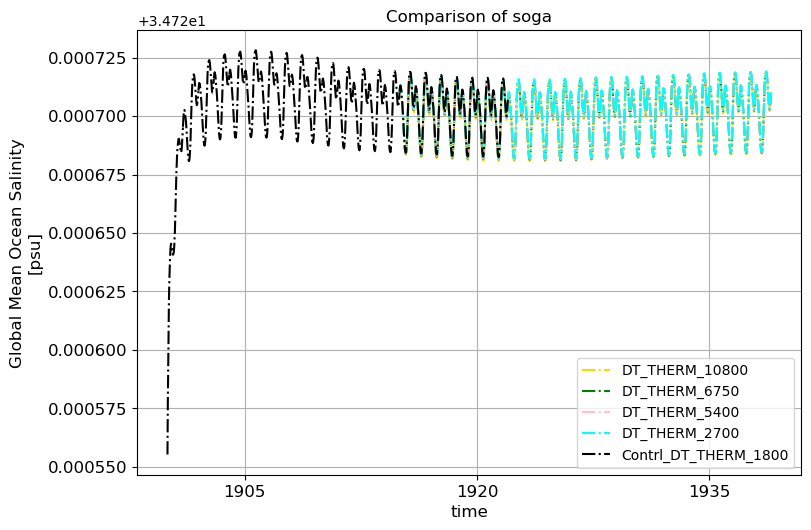

In [9]:
var = 'soga'
#line_style = ['-','--','-.',':']
line_style = ['-.']
line_color = ['gold','green' ,'pink','cyan','black','purple','blue','red']
line_marker = ['o','s','v' ,'d']
subplots = [
            {'indices': None, 'subplot': (2, 2, 4), 'title': 'DT_THERM'   , 'difference': None, 'legend_loc': 'lower right'},
           ]
folder_path = '/g/data/tm70/ml0072/COMMON/git_repos/fork_access-eval-recipes/ml_create_own_datastore/0.25deg_runs'
file_path = os.path.join(folder_path, 'soga.png')
plot_time_series_combo2(rev_sorted_datasets,extracted_MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        subplots=subplots,
                        file_path=file_path)

0
1
2
3
4


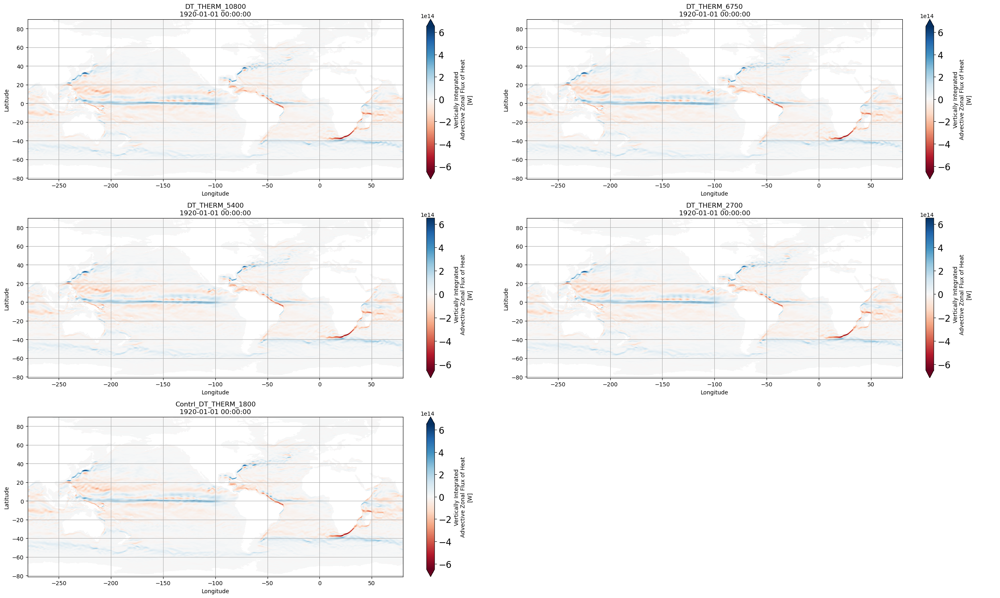

In [10]:
var = 'T_adx_2d'
common_time = pd.Timestamp('1920-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = list(range(5))
datastore_expts = [rev_sorted_datasets[i] for i in tmp_indx]
MOM_names_expts = [extracted_MOM_names_tot[i] for i in tmp_indx]
# plot3d3(rev_sorted_datasets, MOM_names_expts, var,depth_level = None,
#        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15),cbar_range=[-2.4e15,2.4e15])
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        depth_level = None,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15),cbar_range=[-6.5e14,6.5e14])

0
1
2
3
4


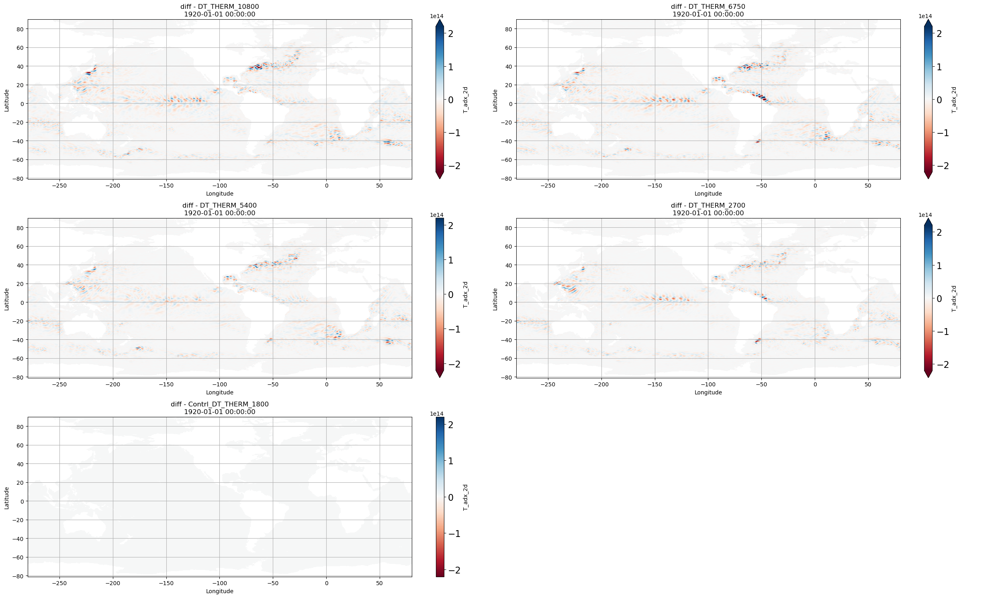

In [11]:
var = 'T_adx_2d'
common_time = pd.Timestamp('1920-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = list(range(5))
datastore_expts = [rev_sorted_datasets[i] for i in tmp_indx]
MOM_names_expts = [extracted_MOM_names_tot[i] for i in tmp_indx]
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[-1],
        depth_level = None,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15),cbar_range=[-2.2e14,2.2e14])

0
1
2
3
4


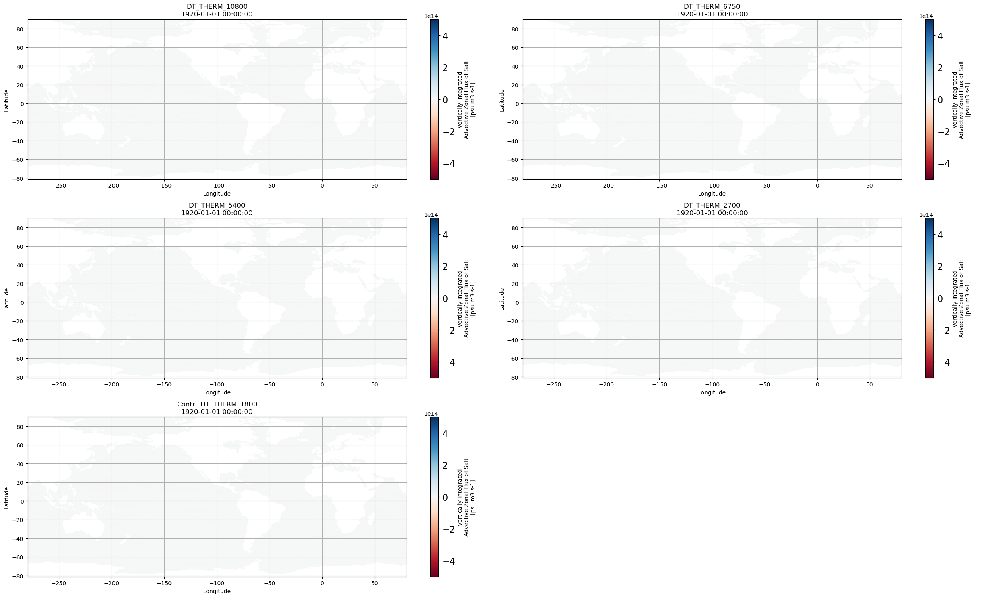

In [12]:
var = 'S_adx_2d'
common_time = pd.Timestamp('1920-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = list(range(5))
datastore_expts = [rev_sorted_datasets[i] for i in tmp_indx]
MOM_names_expts = [extracted_MOM_names_tot[i] for i in tmp_indx]
# plot3d2(datastore_expts, MOM_names_expts, var,depth_level = None,
#        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15),cbar_range=[-2e9,2e9])
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        depth_level = None,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15),cbar_range=[-5e14,5e14])

0
1
2
3
4


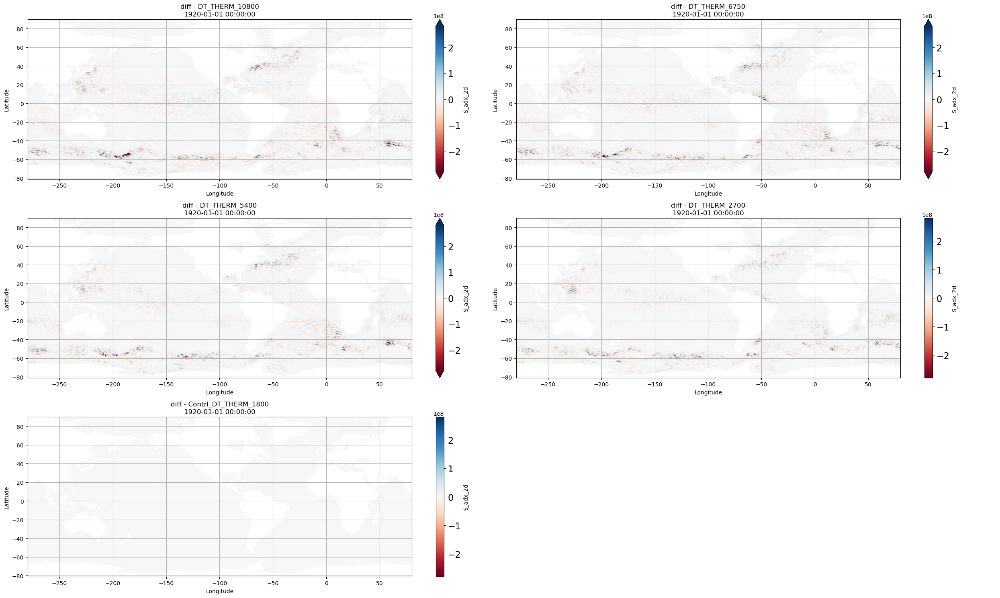

In [13]:
var = 'S_adx_2d'
common_time = pd.Timestamp('1920-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = list(range(5))
datastore_expts = [rev_sorted_datasets[i] for i in tmp_indx]
MOM_names_expts = [extracted_MOM_names_tot[i] for i in tmp_indx]
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[-1],
        depth_level = None,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15), cbar_range=[-2.8e8,2.8e8])

0
1
2
3
4


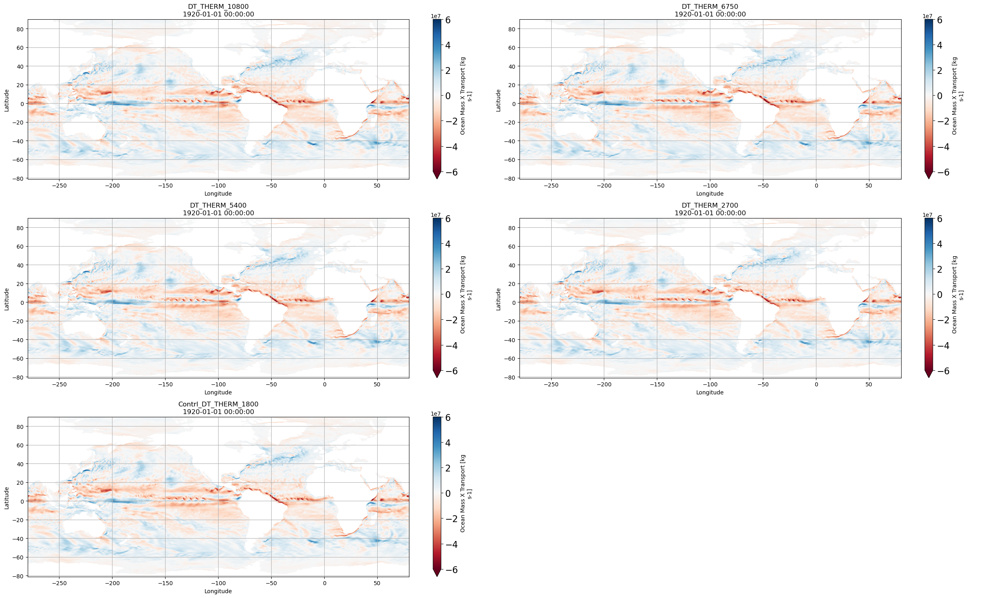

In [14]:
var = 'umo'
common_time = pd.Timestamp('1920-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = list(range(5))
datastore_expts = [rev_sorted_datasets[i] for i in tmp_indx]
MOM_names_expts = [extracted_MOM_names_tot[i] for i in tmp_indx]
# plot3d2(datastore_expts, MOM_names_expts, var,depth_level = 0,
#        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15),cbar_range=[-2.4e8,2.4e8])
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        depth_level = 0,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15), cbar_range=[-6e7,6e7])

0
1
2
3
4


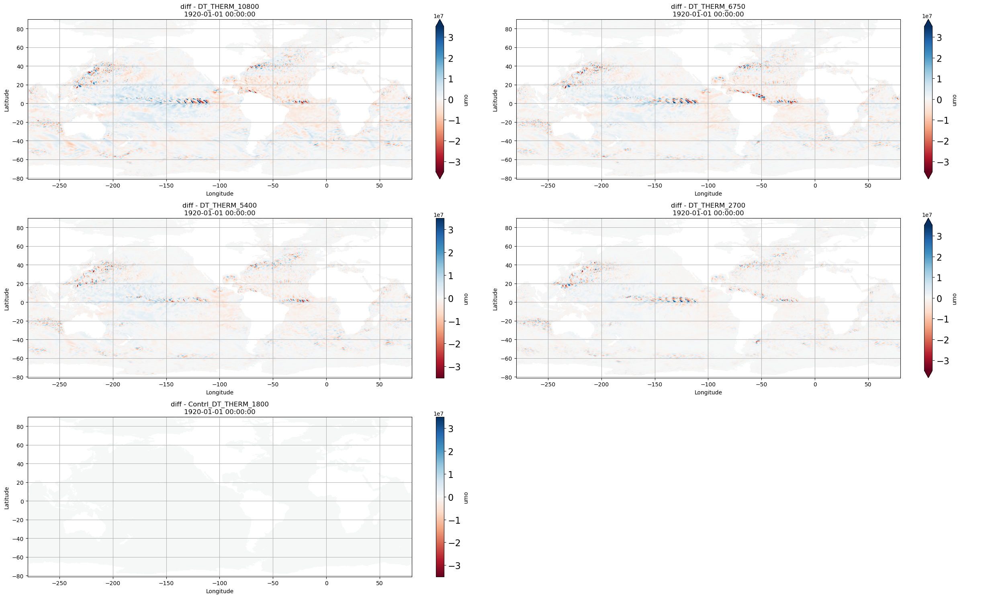

In [15]:
var = 'umo'
common_time = pd.Timestamp('1920-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = list(range(5))
datastore_expts = [rev_sorted_datasets[i] for i in tmp_indx]
MOM_names_expts = [extracted_MOM_names_tot[i] for i in tmp_indx]
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[-1],
        depth_level = 0,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15), cbar_range=[-3.5e7,3.5e7])

0
1
2
3
4


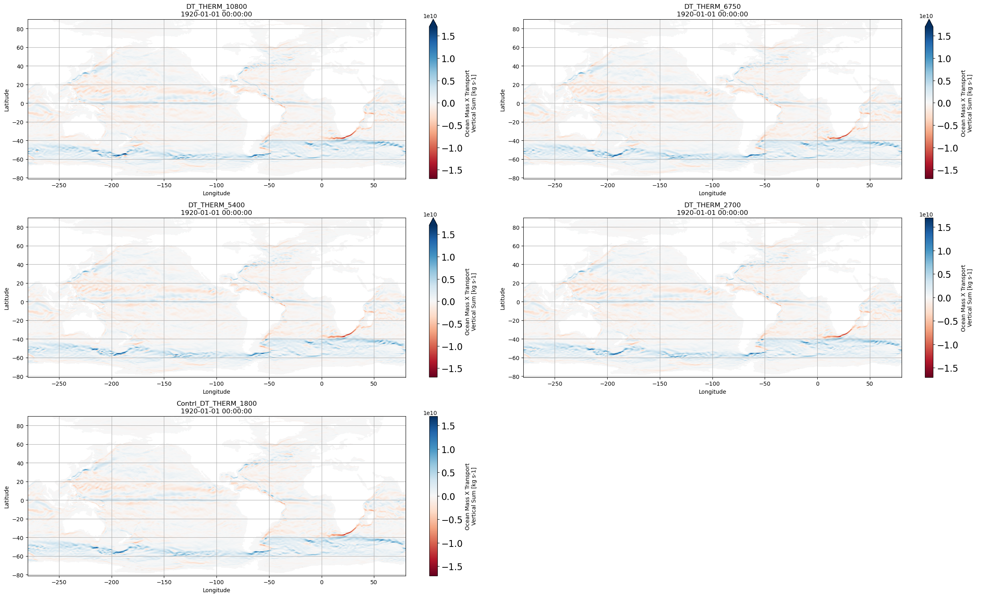

In [16]:
var = 'umo_2d'
common_time = pd.Timestamp('1920-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = list(range(5))
datastore_expts = [rev_sorted_datasets[i] for i in tmp_indx]
MOM_names_expts = [extracted_MOM_names_tot[i] for i in tmp_indx]
# plot3d2(datastore_expts, MOM_names_expts, var,depth_level = None,
#        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15),cbar_range=[-5.5e10,5.5e10])
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        depth_level = None,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15), cbar_range=[-1.7e10,1.7e10])

0
1
2
3
4


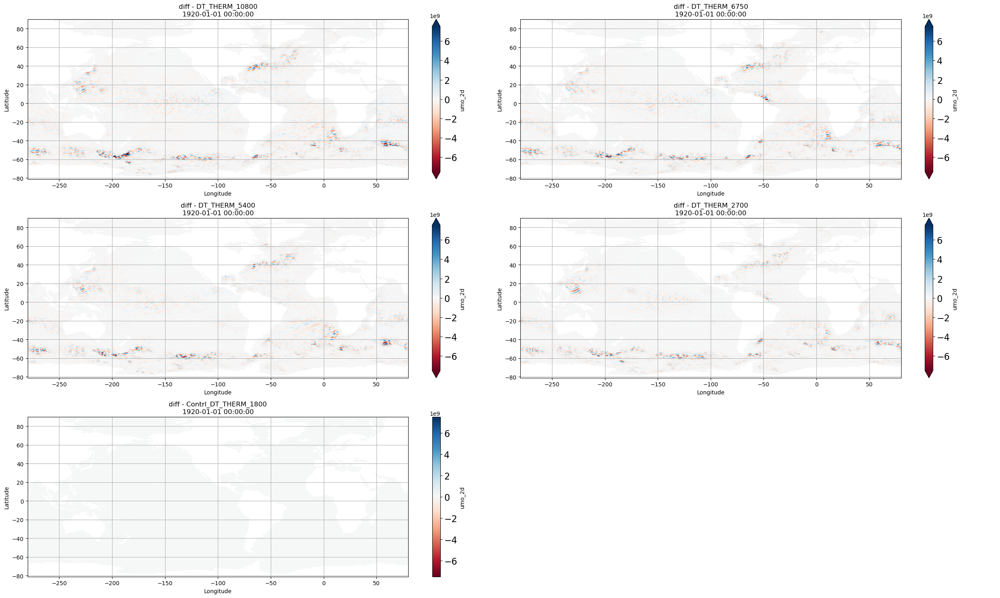

In [17]:
var = 'umo_2d'
common_time = pd.Timestamp('1920-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = list(range(5))
datastore_expts = [rev_sorted_datasets[i] for i in tmp_indx]
MOM_names_expts = [extracted_MOM_names_tot[i] for i in tmp_indx]
plot3d3(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[-1],
        depth_level = None,
        time_selection = 'index', time_index = -1,common_time = common_time,ncols=2,figsize=(25,15), cbar_range=[-7.5e9,7.5e9])